In [2]:
from google.colab import drive 
drive.mount('/content/drive/')


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [3]:
%cd /content/drive/MyDrive/hw4
!ls

/content/drive/MyDrive/hw4
models.py  __pycache__	selfie2anime  train.py


In [4]:
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.datasets as dset
from PIL import Image
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
import numpy as np


In [5]:
# params
N = 64
batchsize = 5
lr = 0.0002
gan = 0.5
lam = 0.3
iden = 0.2
beta1 = 0.5
beta2 = 0.999
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
#load training data
datafolder_trainA = dset.ImageFolder('./selfie2anime/trainA', transform=transforms.ToTensor())
loader_trainA = DataLoader(datafolder_trainA, batch_size=batchsize, shuffle=True)

datafolder_trainB = dset.ImageFolder('./selfie2anime/trainB', transform=transforms.ToTensor())
loader_trainB = DataLoader(datafolder_trainB, batch_size=batchsize, shuffle=True)

datafolder_testA= dset.ImageFolder('./selfie2anime/testA', transform=transforms.ToTensor())
loader_testA = DataLoader(datafolder_testA, batch_size=batchsize, shuffle=True)

datafolder_testB = dset.ImageFolder('./selfie2anime/testB', transform=transforms.ToTensor())
loader_testB = DataLoader(datafolder_testB, batch_size=batchsize, shuffle=True)

In [7]:
# discriminator model
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        '''
        input is 256 x 256 x 3
        no more patchgan, use dilated convolutions

        '''

        self.disc = nn.Sequential(
            nn.Conv2d(3, N, 4, stride=2),
            nn.InstanceNorm2d(N),
            nn.LeakyReLU(),
            nn.Conv2d(N, 2*N, 4, stride=2),
            nn.InstanceNorm2d(2*N),
            nn.LeakyReLU(),
            nn.Conv2d(2*N,4*N, 4),
            nn.InstanceNorm2d(4*N),
            nn.LeakyReLU(),
            nn.Conv2d(4*N, 4*N, kernel_size=3, dilation=2),
            nn.InstanceNorm2d(4*N),
            nn.LeakyReLU(),
            nn.Conv2d(4*N, 4*N, kernel_size=3, dilation=4),
            nn.InstanceNorm2d(4*N),
            nn.LeakyReLU(),
            nn.Conv2d(4*N, 4*N, kernel_size=3, dilation=8),
            nn.InstanceNorm2d(4*N),
            nn.LeakyReLU(),
            nn.Conv2d(4*N, 1, 1),
        )


        ####################
        # original model
        ####################
        # self.disc = nn.Sequential(
        #     nn.Conv2d(3, 64, kernel_size=2, stride=2),
        #     nn.InstanceNorm2d(64),
        #     nn.LeakyReLU(),
        #     nn.Conv2d(64, 128, kernel_size=2, stride=2),
        #     nn.InstanceNorm2d(128),
        #     nn.LeakyReLU(),
        #     nn.Conv2d(128,256, kernel_size=2, stride=2),
        #     nn.InstanceNorm2d(256),
        #     nn.LeakyReLU(),
        #     nn.Conv2d(128, 1, kernel_size=2, stride=2)
        # )

    
    def forward(self, input):
        return self.disc(input)


In [8]:
# generator models
class ResBlock(nn.Module):
    '''
    returns input layer + double convolutions of input layer
    '''
    
    def __init__(self, c):
        super(ResBlock, self).__init__()

        # conv should match input size
        self.conv = nn.Sequential(
            nn.Conv2d(c,c,3,1,1),
            nn.InstanceNorm2d(c),
            nn.ReLU(),
            nn.Conv2d(c,c,3,1,1),
            nn.InstanceNorm2d(c)
        )

        self.relu = nn.ReLU()

    def forward(self, input):
        out = self.conv(input)
        return self.relu(out + input)


class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()

        '''
        trying out architecture more similar to unet
        space out residual blocks into different dimensions
        '''

        self.step1 = nn.Sequential(
            nn.Conv2d(3, N, 4, stride=2),
            nn.InstanceNorm2d(N),
            nn.ReLU(),
            nn.Conv2d(N, 2*N, 4, padding=2),
            nn.InstanceNorm2d(2*N),
            nn.ReLU(),
            ResBlock(2*N),
            ResBlock(2*N),
            ResBlock(2*N)
        )

        self.step2 = nn.Sequential(
            nn.Conv2d(2*N, 4*N, 4, stride=2),
            nn.InstanceNorm2d(4*N),
            nn.ReLU(),
            ResBlock(4*N),
            ResBlock(4*N),
            ResBlock(4*N),
            nn.ConvTranspose2d(4*N, 2*N, 4, stride=2),
            nn.InstanceNorm2d(2*N),
            nn.ReLU()
        )

        self.step3 = nn.Sequential(
            ResBlock(2*N), 
            ResBlock(2*N),
            ResBlock(2*N),
            nn.ConvTranspose2d(2*N, N, 4, stride=2),
            nn.InstanceNorm2d(N),
            nn.ReLU(),
            nn.Conv2d(N, 3, 3)
        )

        ####################
        # original model
        ####################
        # self.encode = nn.Sequential(
        #     nn.Conv2d(3, 64, 7), #64 x 250 x 250
        #     nn.InstanceNorm2d(64),
        #     nn.ReLU(),
        #     nn.Conv2d(64, 128, 3, 2, 0), # 128 x 124 x 124
        #     nn.InstanceNorm2d(128),
        #     nn.ReLU(),
        #     nn.Conv2d(128, 256, 2, 2, 2), # 256 x 64 x 64
        #     nn.InstanceNorm2d(256),
        #     nn.ReLU()
        # )

        # self.res = nn.Sequential(
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128),
        #     ResBlock(128)
        # )

        # self.decode = nn.Sequential(
        #     nn.ConvTranspose2d(256, 128, 2, 2, 2), # 128 x 124 x 124
        #     nn.InstanceNorm2d(128),
        #     nn.ReLU(),
        #     nn.ConvTranspose2d(128, 64, 4, 2, 0), # 64 x 250 x 250
        #     nn.InstanceNorm2d(64),
        #     nn.ReLU(),
        #     nn.ConvTranspose2d(64, 3, 7), # 3 x 256 x 256
        #     nn.Tanh(),
        #     nn.Conv2d(3, 3, 1) # 3 x 256 x 256
        # )

    def forward(self, input):
        # out = self.encode(input)
        # out = self.res(out)
        # out = self.decode(out)
        out1 = self.step1(input)
        out2 = self.step2(out1)
        out3 = self.step3(out1 + out2)
        return out3

In [9]:
# train
def discriminator_loss(real, fake):
    l1 = torch.mean((real-0.9)**2)
    l2 = torch.mean(fake**2)
    return l1 + l2

def generator_loss(fake):
    return torch.mean((fake-0.9)**2)

def cycle_loss(real, fake):
    loss = nn.L1Loss()
    return loss(real, fake)

def identity_loss(fake, real):
  loss = nn.L1Loss()
  return loss(fake, real)

def display_results(real, fake):
    real = real.cpu()
    fake = fake.cpu()
    grid_imgs = torchvision.utils.make_grid(torch.cat((real, fake)), nrow=real.shape[0])
    plt.figure(figsize=(10,10))
    plt.imshow(grid_imgs.permute(1,2,0))
    plt.show()

        


# A = human, B = anime
# GenAB = human to anime generator
# GenBA = anime to human generator
# DA = human face discriminator
# DB = anime face discriminator
def train(GenAB, GenBA, DA, DB, optGAB, optGBA, optDA, optDB, epochs=50):
    for e in range(epochs):
        print(f'Epoch {e}:')

        da_loss = []
        db_loss = []
        gena_loss = []
        genb_loss = []
        cyclea_loss = []
        cycleb_loss = []
        identitya_loss = []
        identityb_loss = []
        iter = 1

        for i, (realA, realB) in enumerate(zip(loader_trainA, loader_trainB)):
            print('.', end=' ')
            realA = realA[0].to(device)
            realB = realB[0].to(device)
            fakeB = GenAB(realA) # generated fake B
            fakeA = GenBA(realB) # generate fake A

            # update discriminatorA
            optDA.zero_grad()
            fakeA = GenBA(realB)
            lossDA = discriminator_loss(DA(realA), DA(fakeA.detach()))
            lossDA.backward()
            optDA.step()

            # update discriminatorB
            optDB.zero_grad()
            fakeB = GenAB(realA)
            lossDB = discriminator_loss(DB(realB), DB(fakeB.detach()))
            lossDB.backward()
            optDB.step()

            # update generators
            optGAB.zero_grad()
            optGBA.zero_grad()
            lossgenA = generator_loss(DB(fakeB)) * gan
            lossgenB = generator_loss(DA(fakeA)) * gan
            losscycleA = cycle_loss(realA, GenBA(fakeB)) * lam
            losscycleB = cycle_loss(realB, GenAB(fakeA)) * lam
            identitylossa = identity_loss(GenAB(realB), realB) * iden
            identitylossb = identity_loss(GenBA(realA), realA) * iden
            total_loss = lossgenA + lossgenB + losscycleA + losscycleB + identitylossa + identitylossb

            total_loss.backward()
            optGAB.step()
            optGBA.step()

            da_loss.append(lossDA)
            db_loss.append(lossDB)
            gena_loss.append(lossgenA)
            genb_loss.append(lossgenB)
            cyclea_loss.append(losscycleA)
            cycleb_loss.append(losscycleB)
            identitya_loss.append(identitylossa)
            identityb_loss.append(identitylossa)

            iter += 1

            if(i % 100 == 0 and i > 0):
                print('\n')
                display_results(realA, fakeB)
            
            del realA
            del realB
            del fakeA
            del fakeB


        print('\n')
        print(f'Epoch losses: DA = {sum(da_loss)/iter} DB = {sum(db_loss)/iter}')
        print(f'GA = {sum(gena_loss)/iter} GB = {sum(genb_loss)/iter}')
        print(f'CA = {sum(cyclea_loss)/iter} CB = {sum(cycleb_loss)/iter}')


In [10]:
#optmizers and models
GenAB = Generator().to(device)
GenBA = Generator().to(device)
DA = Discriminator().to(device)
DB = Discriminator().to(device)

optAB = optim.Adam(GenAB.parameters(), lr, betas=(beta1, beta2))
optBA = optim.Adam(GenBA.parameters(), lr, betas=(beta1, beta2))
optDA = optim.Adam(DA.parameters(), lr, betas=(beta1, beta2))
optDB = optim.Adam(DB.parameters(), lr, betas=(beta1, beta2))

In [ ]:
train(GenAB, GenBA, DA, DB, optAB, optBA, optDA, optDB)

In [14]:
def show_test_results():
  for i, (ta,tb) in enumerate(zip(loader_testA, loader_testB)):
    ta = ta[0].to(device)
    tb = tb[0].to(device)

    fakeB = GenAB(ta)
    fakeA = GenBA(tb)

    display_results(ta, fakeB)
    display_results(tb, fakeA)

    del ta
    del tb

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


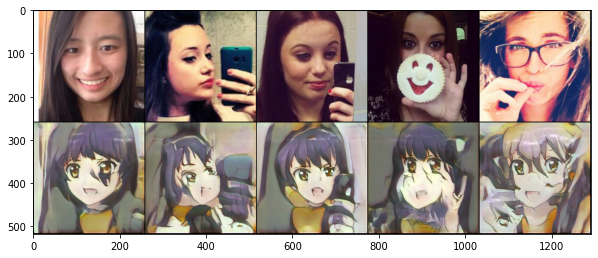

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


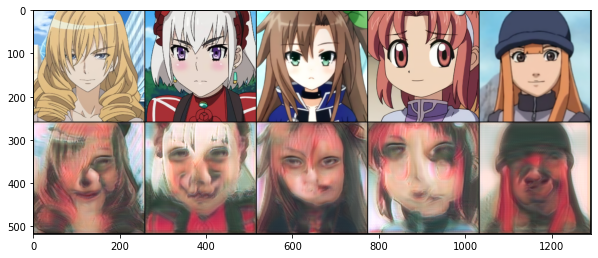

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


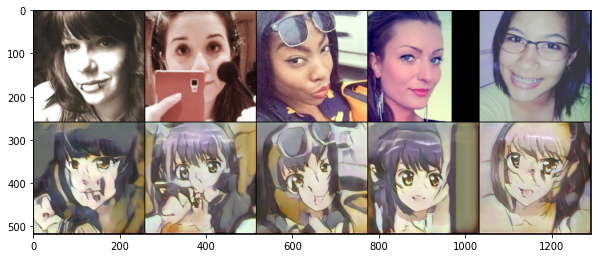

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


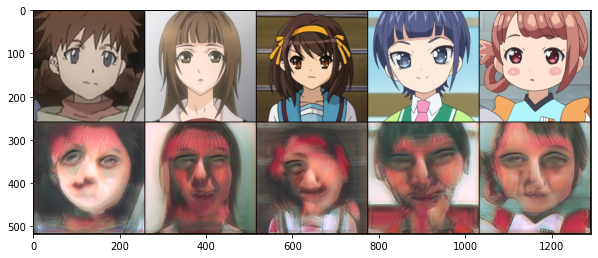

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


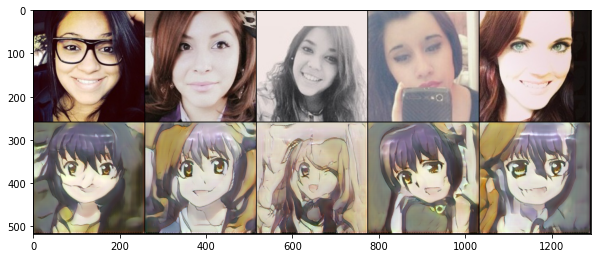

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


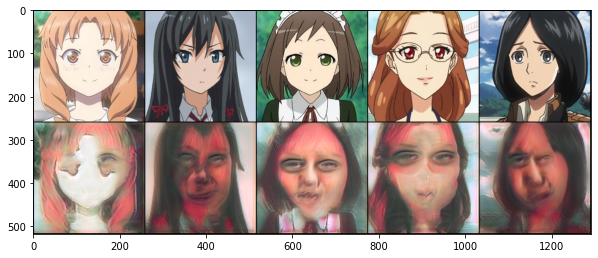

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


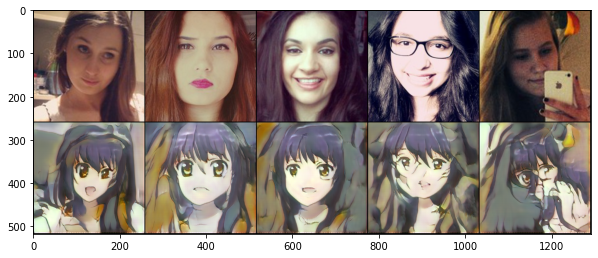

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


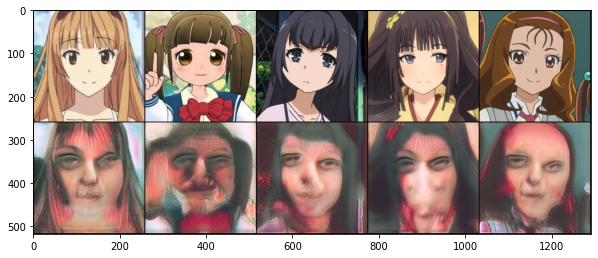

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


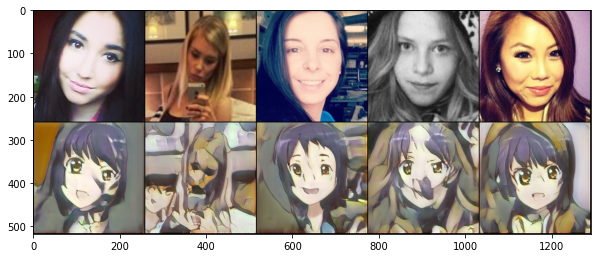

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


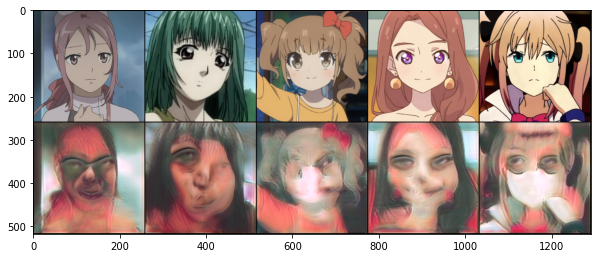

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


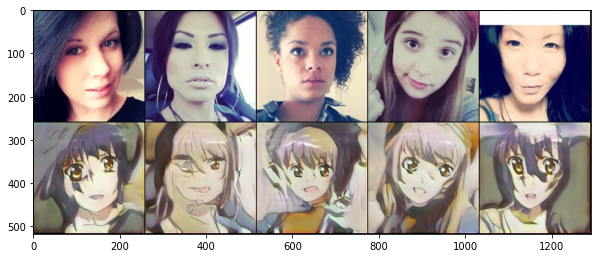

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


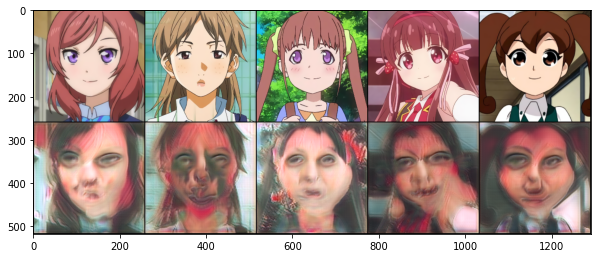

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


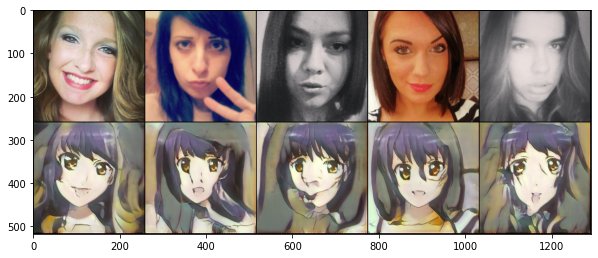

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


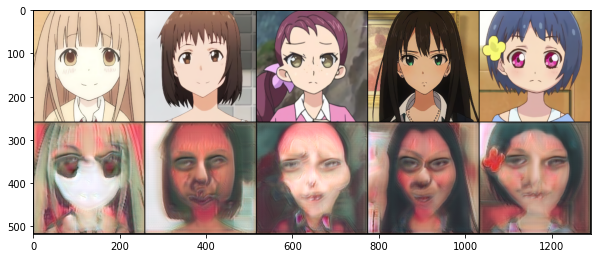

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


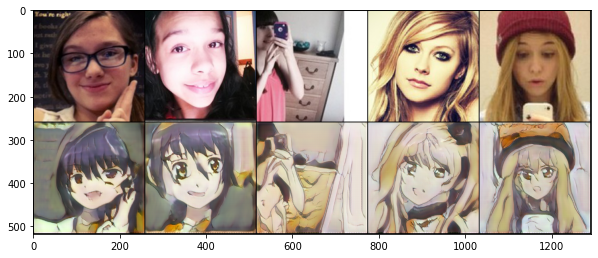

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


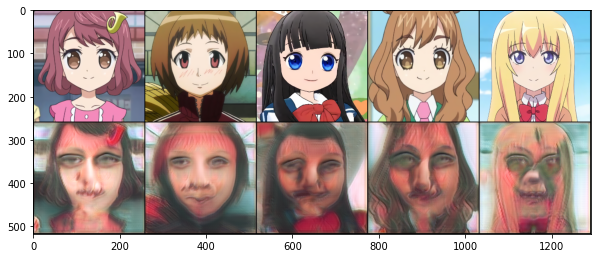

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


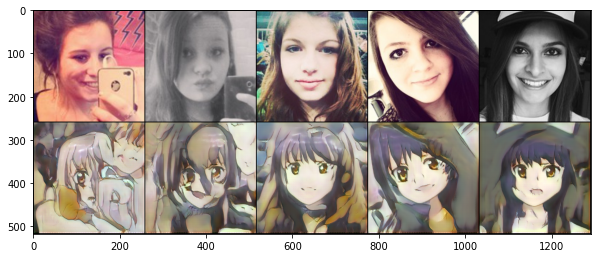

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


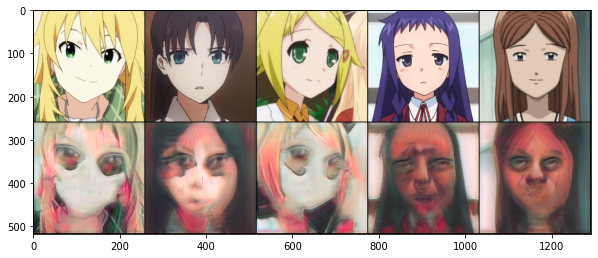

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


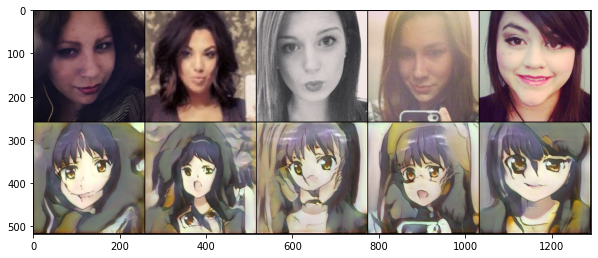

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


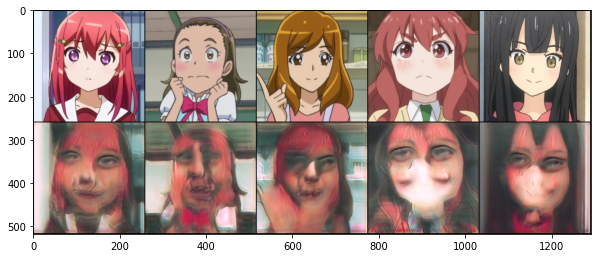

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


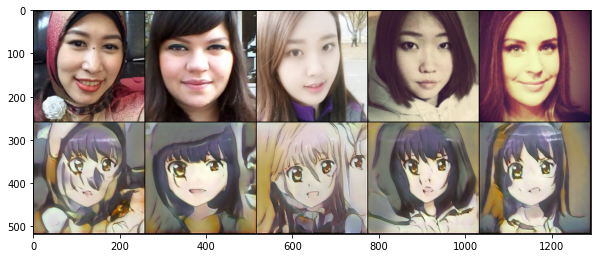

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


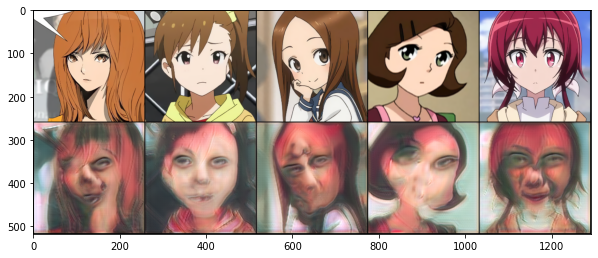

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


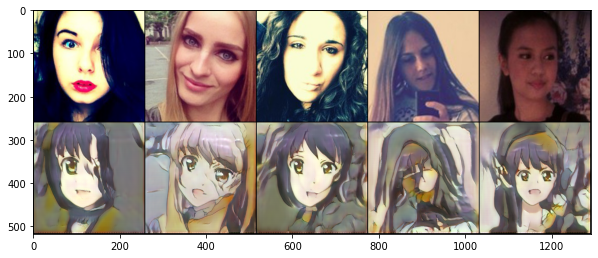

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


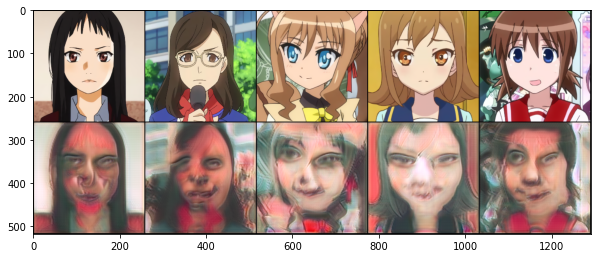

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


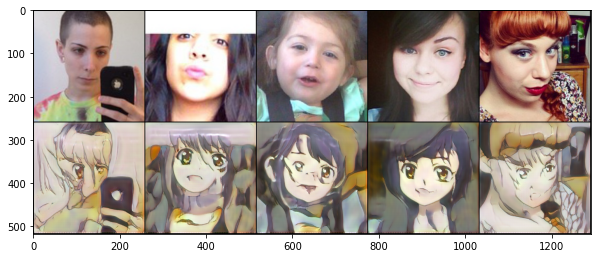

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


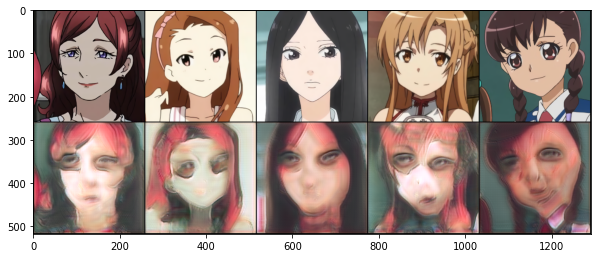

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


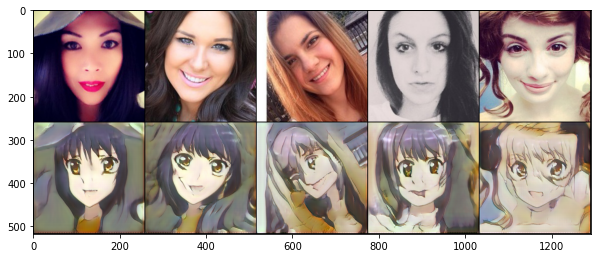

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


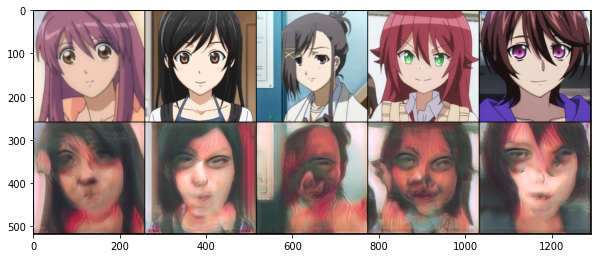

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


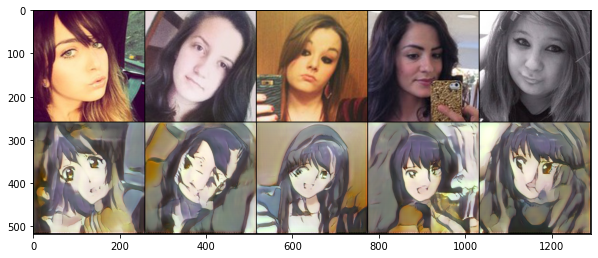

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


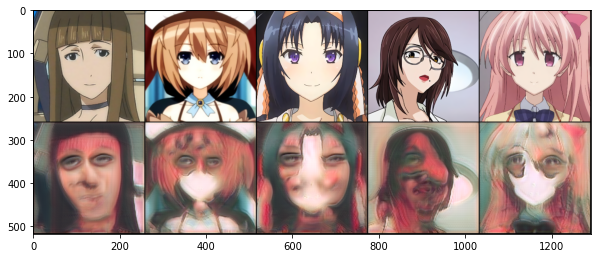

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


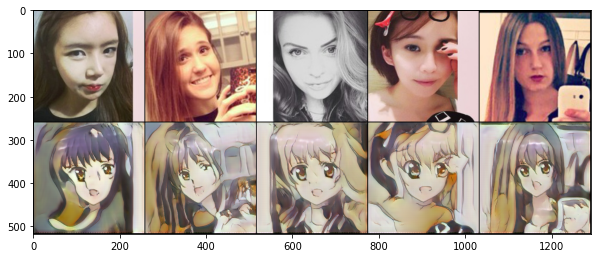

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


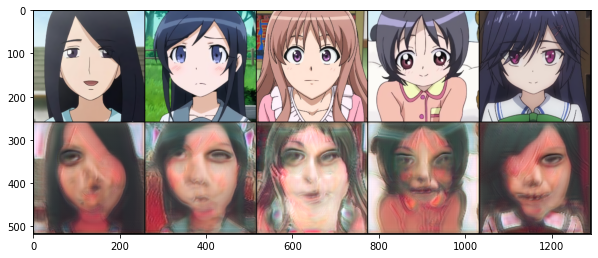

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


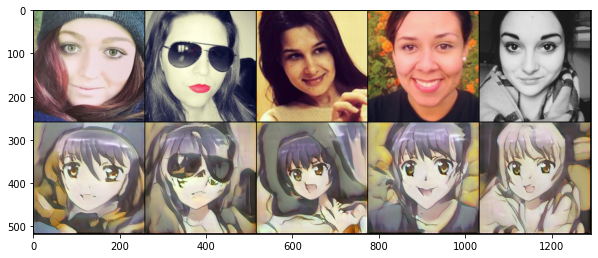

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


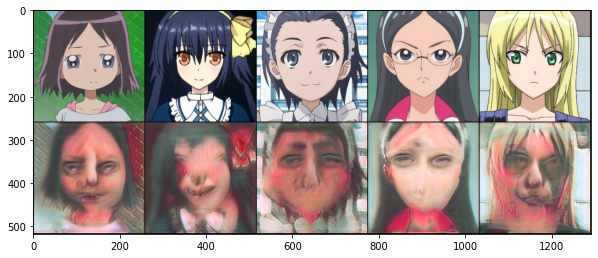

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


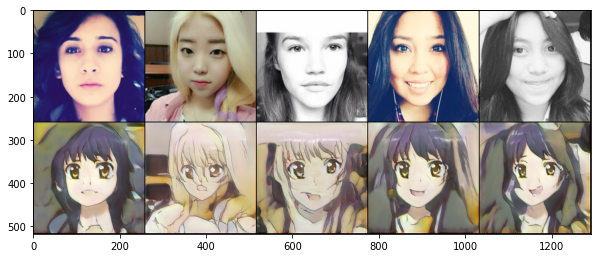

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


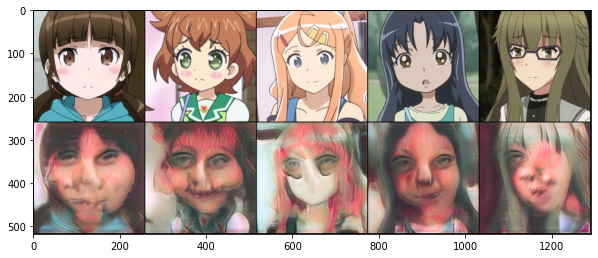

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


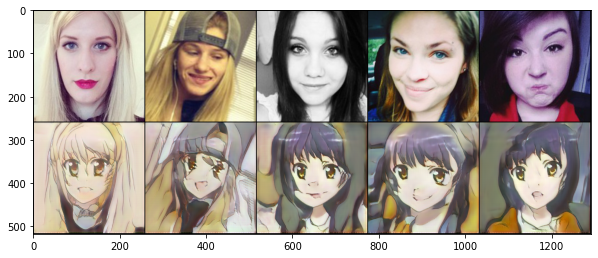

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


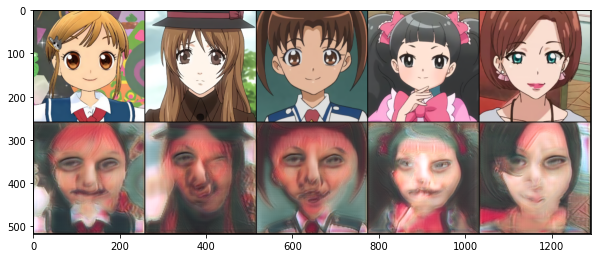

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


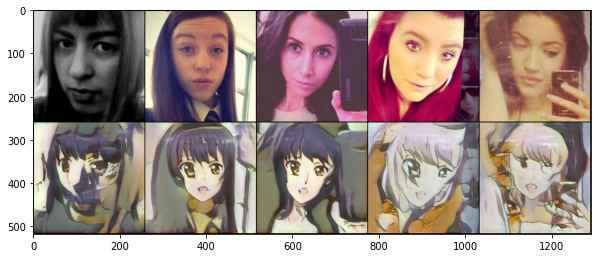

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


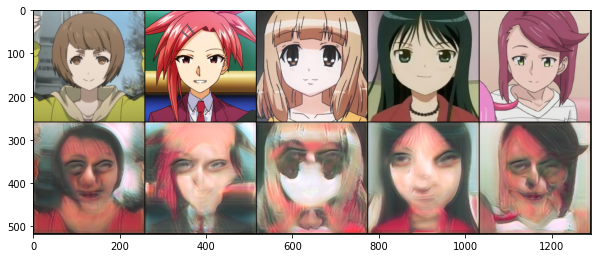

In [15]:
show_test_results()